##### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:Green;"> Exploratory Data Analysis for Classification datasets

#### <span style="font-family: Arial;font-size:1em;color:green;">  Import the libraries :

In [236]:
#Enable graph plotting in Jupyter
%matplotlib inline

# Numerical libraries
import numpy as np  

# to handle data in form of rows and columns 
import pandas as pd    

import seaborn as sns
sns.set(color_codes=True)
sns.set_style("whitegrid")

from IPython.display import display, Javascript

#### <span style="font-family: Arial;font-size:1em;color:green;">  Enter the filename along with extension (Accepted format: csv/xls/xls) 
##### Example: Cancer.csv

In [237]:
filename =''
while filename =='':
    filename = input('Enter the filename (with extension): ')
    if not filename:
        display(Javascript("""
        require(
        ["base/js/dialog"], 
        function(dialog) {
        dialog.modal({
            title: 'Hello User !',
            body: 'Sadly, without your file, I can not proceed !',
            textarea: 'Hello',
            buttons: {
                'Retry': {}
            },
        });
    })
    """))


Enter the filename (with extension): Cancer_data.csv


#### <span style="font-family: Arial;font-size:1em;color:green;"> Reading the file ..

In [238]:
data=pd.DataFrame()
def rData(fname):
    if fname.find('csv') != -1:
        return pd.read_csv(fname,engine='python',sep=',') #Assuming the delimiter is ",".For anything else, please change here
    elif fname.find('data') != -1:
        return pd.read_csv(fname,engine='python',sep=',') #Assuming the delimiter is ",".For anything else, please change here
    elif fname.find('xlsx') != -1:
        return pd.read_excel(fname)
    elif fname.find('xls') != -1:
        return pd.read_excel(fname)
    else:
        print("Either we haven't mentioned the extension or format is not accepted !")
        return data

data= rData(filename)

#### <span style="font-family: Arial;font-size:1em;color:green;"> Displaying the first 10 records..

In [239]:
data.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.1471,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.2654,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.1279,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2654,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.1052,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2654,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.1043,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.2654,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.2654,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.074,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.2654,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.2654,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2654,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2654,0.4366,0.20750


#### <span style="font-family: Arial;font-size:1em;color:green;"> Identify the ID column (if any)

##### NOTE: It is an usual practice to drop the  ID columns from the dataset. However, the data may have duplicate values for all the attributes and the unique ID may be the only column differentiating the datapoints. If we wish to asses the duplicates along with the unique ID, you must retain it untill that point. 

In [240]:
ID_colname= input('Please provide the name of the identification column if present": ')
if not ID_colname:
     display(Javascript("""
    require(
    ["base/js/dialog"], 
    function(dialog) {
        dialog.modal({
            title: 'Hello !',
            body: 'No ID column entered',
            buttons: {
                'OK': {}
            },
        });
    })
    """))

Please provide the name of the identification column if present": id


#### <span style="font-family: Arial;font-size:1em;color:green;"> Datatypes of all the columns:

In [241]:
DT=data.dtypes.to_frame(name='Datatypes')
DT.reset_index(level=None, drop=False, inplace=True)
DT.rename(columns ={'index':'Columns'},inplace=True)
DT

,Columns,Datatypes
0,id,int64
1,diagnosis,object
2,radius_mean,float64
3,texture_mean,float64
4,perimeter_mean,float64
5,area_mean,float64
6,smoothness_mean,float64
7,compactness_mean,float64
8,concavity_mean,float64
9,concave points_mean,object


#### <span style="font-family: Arial;font-size:1em;color:green;"> Missing Value Handling for EDA

##### NOTE: Missing Value imputation is part of data pre processing. However, in order to plot/ depict various columns in the form of graphs, we will handle few specific missing value cases

##### <span style="font-family: Arial;font-size:1em;color:green;"> Step 1: We will see if there is any special characters/incorrect values as per the data type defined

In [242]:
for col in data.columns[data.dtypes == 'object']:  
    temp= pd.DataFrame(data[col].str.isdigit())
    temp= pd.DataFrame(data[col].str.contains('[\?*&^%$#@!]')== True)
    res = (temp[col].values == True).sum()
    ans=''
    ans_convert=''
    if res>0:
        print("\033[1m" + "The column",col,", in spite of being Object type stores digits. Following are the exceptions:"  + "\033[0m" )
        #print(data.loc[~data[col].astype(str).str.isdigit()][col])
        print(data.loc[data[col].astype(str).str.contains('[\?*&^%$#@!]') == True][col])
        while ans =='':
            ans = input('Do you want to replace special characters with Nan ? (Y/N) ')
        if ans == 'Y':
            print("\033[1m" + "Replacing the special characters with NaN"  + "\033[0m" )
            data[col]  = data[col].replace('?', np.nan)
            print(data.loc[data[col].isna()][col] )
            ans=''
        while ans_convert =='':
            print("\033[1m" + "Column" + "\033[0m",col)
            ans_convert = input('Do you want to convert the column to float type ? (Y/N) ')   
        if ans_convert == 'Y':
            print("\033[1m" + "Changing datatype to Float for Column:"  + "\033[0m", col)
            data[col]=data[col].astype(float)
            data[col].dtypes
            ans_convert=''
        



The column concave points_mean , in spite of being Object type stores digits. Following are the exceptions:
174    ?
175    ?
225    ?
226    ?
227    ?
228    ?
229    ?
Name: concave points_mean, dtype: object
Do you want to replace special characters with Nan ? (Y/N) Y
Replacing the special characters with NaN
174    NaN
175    NaN
225    NaN
226    NaN
227    NaN
228    NaN
229    NaN
Name: concave points_mean, dtype: object
Column concave points_mean
Do you want to convert the column to float type ? (Y/N) Y
Changing datatype to Float for Column: concave points_mean
The column perimeter_se , in spite of being Object type stores digits. Following are the exceptions:
115    ?
143    ?
154    ?
187    ?
188    ?
189    ?
190    ?
191    ?
192    ?
193    ?
194    ?
195    ?
295    ?
296    ?
297    ?
298    ?
Name: perimeter_se, dtype: object
Do you want to replace special characters with Nan ? (Y/N) Y
Replacing the special characters with NaN
115    NaN
143    NaN
154    NaN
187    N

##### <span style="font-family: Arial;font-size:1em;color:green;"> Step 2: Now that we have all NaN as the missing values. we can go ahead with our Missing Value replacement techniques. Counts of NaN per column as below:

##### Count of missing values before imputating

In [243]:
for col in data.columns:
    print(col,sum(data[col].isna()))

id 0
diagnosis 0
radius_mean 0
texture_mean 0
perimeter_mean 0
area_mean 0
smoothness_mean 0
compactness_mean 0
concavity_mean 0
concave points_mean 7
symmetry_mean 0
fractal_dimension_mean 0
radius_se 0
texture_se 0
perimeter_se 16
area_se 0
smoothness_se 0
compactness_se 0
concavity_se 0
concave points_se 0
symmetry_se 0
fractal_dimension_se 0
radius_worst 0
texture_worst 0
perimeter_worst 0
area_worst 0
smoothness_worst 0
compactness_worst 0
concavity_worst 0
concave points_worst 0
symmetry_worst 0
fractal_dimension_worst 0


In [245]:
Target = ''
while Target == '':
    Target = input('Enter the Target Column Name: ')

Enter the Target Column Name: diagnosis


##### <span style="font-family: Arial;font-size:1em;color:green;"> Step 3: Choose a method for missing value imputation:
##### 1. Forward Fill
##### 2. Backward Fill
##### 3. Replace with Mean
##### 4. Replace with Median

##### NOTE: The following will work on only numerical data types. For handling missing values in Categorical variables, plesae use hot encoding/label encoding techniques.

In [246]:
Choice = input('Enter your choice: [1/2/3/4] ')

Enter your choice: [1/2/3/4] 4


In [247]:
def fillna_myversion(col_name,method_passed): 
    orig_dt=data[col_name].dtypes
    if method_passed in ['ffill','bfill']:
        data[col_name].fillna(method=method_passed,inplace=True)
    elif method_passed == 'mean':
        data[col].fillna(data[col].mean(),inplace=True)
    elif method_passed == 'median':
        data[col].fillna(data[col].median(),inplace=True)
    updated_dt=data[col_name].dtypes
    if orig_dt != updated_dt:
        if orig_dt == 'float64':
            data[col_name]=data[col_name].astype(float)
        elif orig_dt == 'int64':
            data[col_name]=data[col_name].astype(int)
    

In [248]:
nan_list=data.columns[data.isna().any()].tolist()
nan_list
for col in data.columns[data.dtypes == 'object']:  
    if col in nan_list:
        nan_list.remove(col)

if Target in nan_list:
    nan_list.remove(Target)


if Choice == '1':
    for col in nan_list:
        fillna_myversion(col,'ffill')
elif Choice == '2':
    for col in nan_list:
        fillna_myversion(col,'bfill')
elif Choice == '3':
    for col in nan_list:
        fillna_myversion(col,'mean')
elif Choice == '4':
    for col in nan_list:
        fillna_myversion(col,'median')
        
for col in data.columns:
    print(col,sum(data[col].isna()))

id 0
diagnosis 0
radius_mean 0
texture_mean 0
perimeter_mean 0
area_mean 0
smoothness_mean 0
compactness_mean 0
concavity_mean 0
concave points_mean 0
symmetry_mean 0
fractal_dimension_mean 0
radius_se 0
texture_se 0
perimeter_se 0
area_se 0
smoothness_se 0
compactness_se 0
concavity_se 0
concave points_se 0
symmetry_se 0
fractal_dimension_se 0
radius_worst 0
texture_worst 0
perimeter_worst 0
area_worst 0
smoothness_worst 0
compactness_worst 0
concavity_worst 0
concave points_worst 0
symmetry_worst 0
fractal_dimension_worst 0


#### <span style="font-family: Arial;font-size:1em;color:green;"> Printing the shape

In [249]:
print('Number of features:',data.shape[1], '& Number of datapoints:', data.shape[0])

Number of features: 32 & Number of datapoints: 299


#### <span style="font-family: Arial;font-size:1em;color:green;"> Check Imbalance of data based on target column:

##### We are going to use this information while doing our Train Test Split!

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000020319D0CB88>],
      dtype=object)

<Figure size 80x80 with 0 Axes>

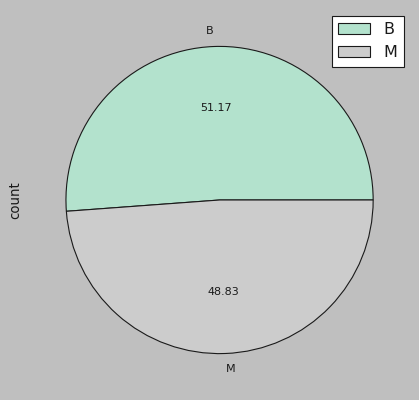

In [250]:
import matplotlib.pyplot as plt   
import matplotlib.style
if Target=='':
    Target = input('Enter the Target Column Name: ')

plt.style.use('classic')
plt.figure(figsize = (1,1))
cols= pd.crosstab(index=data[Target],columns="count")
cols.plot(kind='pie',subplots=True,legend=True,fontsize=10,autopct='%.2f',colormap ='Pastel2')

#### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Data Visualization

### <span style="font-family: Arial;font-size:1em;color:green;"> 1. Univariate Plotting:

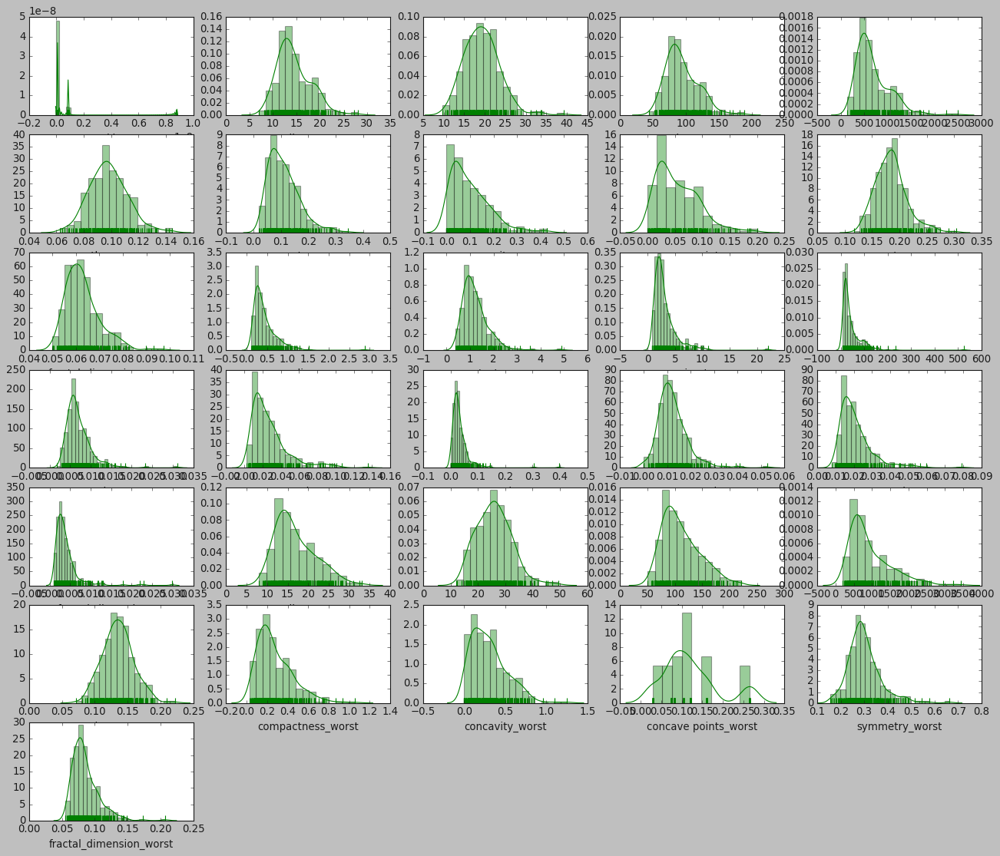

In [251]:
col_list=data.columns.tolist()
if data[Target].dtypes != 'object':
    col_list.remove(Target)

for col in data.columns[data.dtypes == 'object']:  
    col_list.remove(col)

if len(col_list) == 1:
    sns.distplot(a=data[col_list], kde=True, rug=True,color='green')
else:
    fig, axes = plt.subplots(int(len(col_list)/2),5, figsize=(20,(len(col_list)/2)+20))#Adjust the dimension here
    axes = axes.flatten()

    i = 0
    for t in col_list:
        ax = sns.distplot(a=data[t], kde=True, rug=True, ax=axes[i],color='green')
        fig=plt.gcf()
        i +=1
    
    for k in range(1,((int((len(col_list)/2))*5)+1)-int(len(col_list))):
        axes.flat[-1*k].set_visible(False)


### <span style="font-family: Arial;font-size:1em;color:green;"> 2: Outlier detection - Graphical

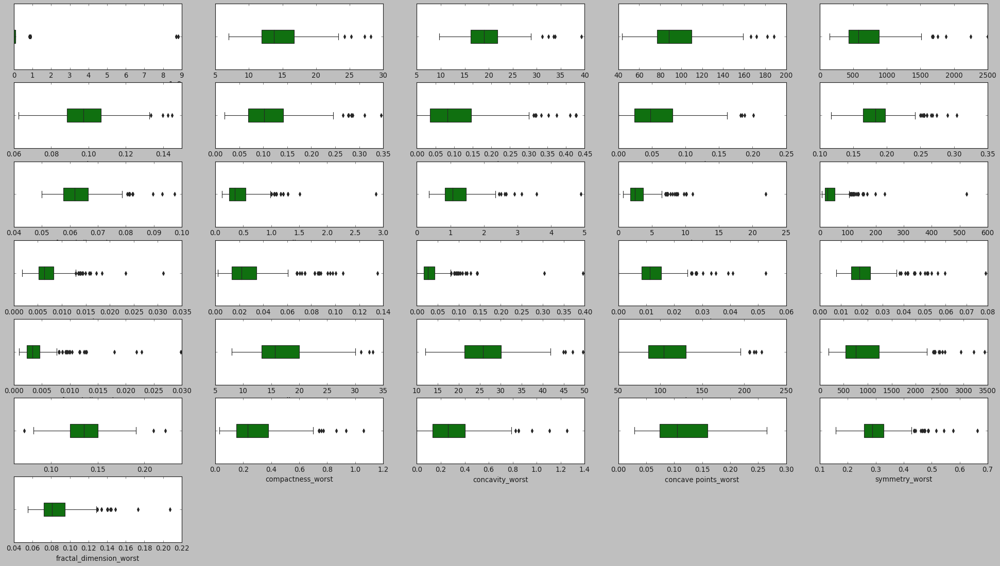

In [252]:
col_list=data.columns.tolist()
for col in data.columns[data.dtypes == 'object']:  
    col_list.remove(col)


fig, axes = plt.subplots(int(len(col_list)/2),5, figsize=((len(col_list)/2)+15,(len(col_list)/2)+20))#Adjust the dimension here
axes = axes.flatten()

i = 0
for t in col_list:
    ax = sns.boxplot( y=t, data=data, orient='h', width=0.2,  ax=axes[i],color='green')
    fig=plt.gcf()
    i +=1
    
for k in range(1,((int((len(col_list)/2))*5)+1)-int(len(col_list))):
    axes.flat[-1*k].set_visible(False)

### <span style="font-family: Arial;font-size:1em;color:green;"> 3. Print the statistical information - I

In [253]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,299.0,2.631453e+07,1.033933e+08,8670.000000,861597.500000,875938.000000,8.811651e+06,8.810948e+08
radius_mean,299.0,1.445611e+01,3.548421e+00,6.981000,11.890000,13.710000,1.676000e+01,2.811000e+01
texture_mean,299.0,1.930726e+01,4.286588e+00,9.710000,16.270000,19.040000,2.184000e+01,3.928000e+01
perimeter_mean,299.0,9.434254e+01,2.447531e+01,43.790000,76.895000,88.400000,1.098500e+02,1.885000e+02
area_mean,299.0,6.848983e+02,3.546359e+02,143.500000,434.200000,578.300000,8.832500e+02,2.499000e+03
smoothness_mean,299.0,9.796803e-02,1.386364e-02,0.062510,0.088600,0.097400,1.065500e-01,1.447000e-01
compactness_mean,299.0,1.109813e-01,5.656404e-02,0.019380,0.068590,0.101700,1.420500e-01,3.454000e-01
concavity_mean,299.0,9.983743e-02,8.276813e-02,0.000000,0.035075,0.081690,1.461000e-01,4.268000e-01
concave points_mean,299.0,5.501602e-02,3.868585e-02,0.000000,0.024165,0.047885,8.106000e-02,2.012000e-01
symmetry_mean,299.0,1.850388e-01,2.919495e-02,0.116700,0.164850,0.183000,1.978500e-01,3.040000e-01


### <span style="font-family: Arial;font-size:1em;color:green;"> 4. Print the statistical information - II

In [254]:
## Function where you pass the column name of the dataframe and this will do the univariate analysis
def univariate_analysis(col_name):
    Column=data[col_name]
  
  
    mean=Column.mean()
    median=Column.median()
    mode=Column.mode()
    skew=Column.skew()
    print( "\033[1m" + col_name + ":" + "\033[0m" )
    print("____________________")
    
    print('Mean: ',mean,'\nMedian: ',median,'\nMode: ',mode[0], '\nSkewness: ',skew)
    if skew>0:
        print( "\033[0;32m" + "Positively Skewed" +  "\033[0;32m" )
    elif skew<0:
        print("\033[1;31m" +  "\033[1m" + "Negatively Skewed" + "\033[1;31m")
    else:
        print("\033[1m" + "Symmetric Distribution" + "\033[0m")
    print("\033[1m" + "________________________________________________________________________\n" + "\033[0m")


col_list=data.columns.tolist()
for col in col_list:
    if 'object' != data[col].dtypes:
        univariate_analysis(col)


id:
____________________
Mean:  26314530.06020067 
Median:  875938.0 
Mode:  8670 
Skewness:  7.519693450710574
Positively Skewed
________________________________________________________________________

radius_mean:
____________________
Mean:  14.456107023411375 
Median:  13.71 
Mode:  12.89 
Skewness:  0.7978040575777192
Positively Skewed
________________________________________________________________________

texture_mean:
____________________
Mean:  19.307257525083624 
Median:  19.04 
Mode:  15.18 
Skewness:  0.6855508336621429
Positively Skewed
________________________________________________________________________

perimeter_mean:
____________________
Mean:  94.34254180602008 
Median:  88.4 
Mode:  58.79 
Skewness:  0.8406780698629117
Positively Skewed
________________________________________________________________________

area_mean:
____________________
Mean:  684.8983277591974 
Median:  578.3 
Mode:  512.2 
Skewness:  1.4908957232127993
Positively Skewed
___________________

### <span style="font-family: Arial;font-size:1em;color:green;"> 5. Bivariate Analysis 

##### <span style="font-family: Arial;font-size:1em;color:green;"> Print Correlation matrix

In [255]:
corr_matrix=data.corr()
corr_matrix

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.026320,0.163354,0.025927,0.030678,0.012275,0.028617,0.047194,0.014307,0.059538,...,0.005785,0.096039,0.007424,0.010436,0.000482,0.022298,0.031843,0.028445,-0.012050,0.023723
radius_mean,0.026320,1.000000,0.420084,0.997395,0.987963,0.111536,0.486548,0.629040,0.788092,0.139971,...,0.960745,0.365207,0.956999,0.937066,0.084032,0.385605,0.474005,0.156359,0.137214,0.002494
texture_mean,0.163354,0.420084,1.000000,0.425949,0.405250,0.016231,0.305985,0.334351,0.349144,0.085113,...,0.458909,0.911130,0.460369,0.444205,0.144232,0.356423,0.348167,-0.002042,0.151174,0.186223
perimeter_mean,0.025927,0.997395,0.425949,1.000000,0.986261,0.153669,0.543357,0.673495,0.821755,0.179342,...,0.960364,0.371490,0.962728,0.936480,0.117432,0.430761,0.512956,0.164168,0.165288,0.047606
area_mean,0.030678,0.987963,0.405250,0.986261,1.000000,0.118945,0.472950,0.635260,0.785359,0.131657,...,0.946893,0.344303,0.943274,0.944384,0.084209,0.355211,0.457237,0.139308,0.107777,-0.006551
smoothness_mean,0.012275,0.111536,0.016231,0.153669,0.118945,1.000000,0.640377,0.534069,0.553284,0.559241,...,0.162940,0.067869,0.193220,0.154960,0.775310,0.481480,0.438602,0.109621,0.412732,0.507815
compactness_mean,0.028617,0.486548,0.305985,0.543357,0.472950,0.640377,1.000000,0.884156,0.834587,0.616211,...,0.522274,0.305817,0.579814,0.492536,0.533242,0.859046,0.798060,0.197523,0.533711,0.674484
concavity_mean,0.047194,0.629040,0.334351,0.673495,0.635260,0.534069,0.884156,1.000000,0.900293,0.522162,...,0.638803,0.315275,0.680950,0.623561,0.442209,0.729219,0.865979,0.172148,0.419876,0.522081
concave points_mean,0.014307,0.788092,0.349144,0.821755,0.785359,0.553284,0.834587,0.900293,1.000000,0.491131,...,0.795026,0.320359,0.824858,0.774012,0.433935,0.653321,0.713597,0.204377,0.377528,0.370846
symmetry_mean,0.059538,0.139971,0.085113,0.179342,0.131657,0.559241,0.616211,0.522162,0.491131,1.000000,...,0.180726,0.113698,0.218448,0.161155,0.399859,0.483710,0.445710,0.149418,0.703357,0.432762


##### <span style="font-family: Arial;font-size:1em;color:green;"> Print Column pairs which has correlation > 75%

In [256]:
k = data.corr().where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool)).unstack().to_frame(name='Corr')
corr_mat=k.reset_index(level=[0,1])
corr_mat.rename(columns ={'level_0':'Col1','level_1':'Col2' },inplace=True)
corr_pairs=corr_mat[((corr_mat['Corr'] > 0.75) & (corr_mat['Corr'] < 1)) | (corr_mat['Corr'] < -0.75)] # Threshold: 75
corr_pairs.reset_index(inplace=True)
corr_pairs.drop(['index'],axis=1,inplace=True)
#corr_pairs
corr_pairs

C:\Users\sense\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Col1,Col2,Corr
0,perimeter_mean,radius_mean,0.997395
1,area_mean,radius_mean,0.987963
2,area_mean,perimeter_mean,0.986261
3,concavity_mean,compactness_mean,0.884156
4,concave points_mean,radius_mean,0.788092
5,concave points_mean,perimeter_mean,0.821755
6,concave points_mean,area_mean,0.785359
7,concave points_mean,compactness_mean,0.834587
8,concave points_mean,concavity_mean,0.900293
9,perimeter_se,radius_se,0.963138


##### <span style="font-family: Arial;font-size:1em;color:green;"> Plot joint plot for all column pairs where correlation is greater than 75%. If you wish to change the threshold, change in the above cell.

C:\Users\sense\Anaconda3\lib\site-packages\seaborn\axisgrid.py:1675: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


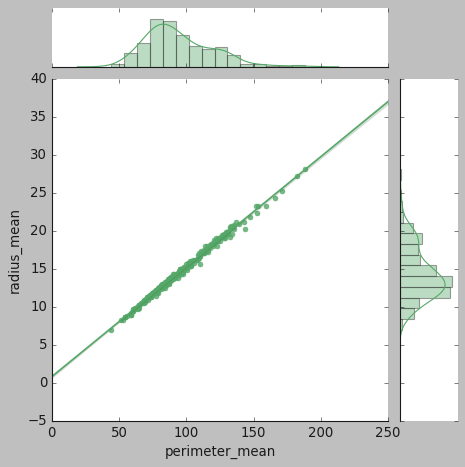

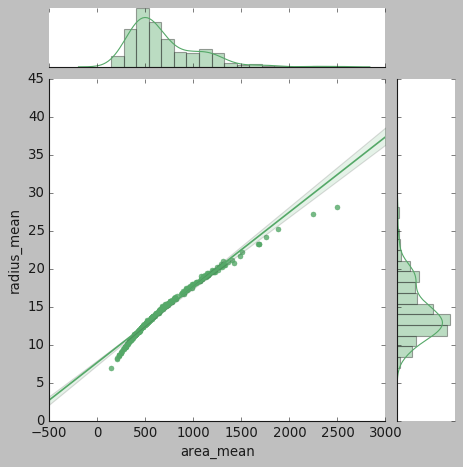

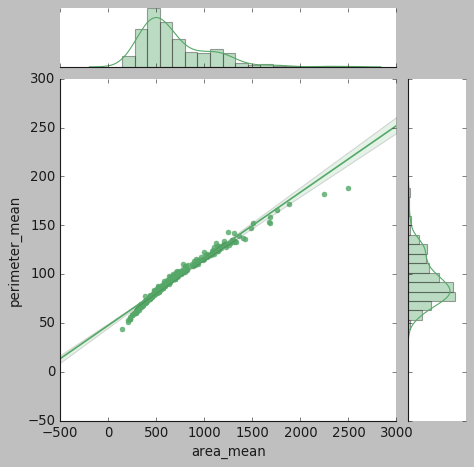

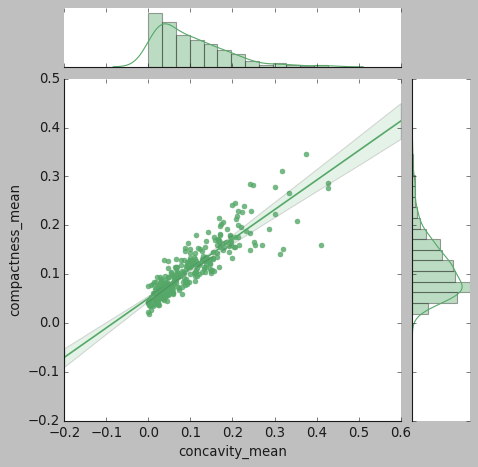

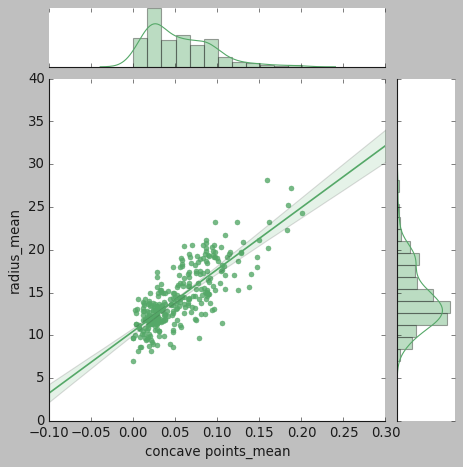

...

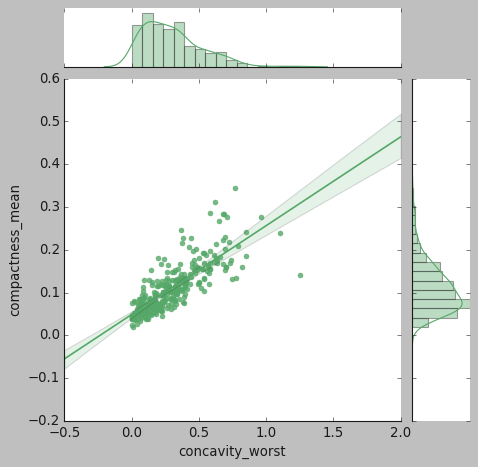

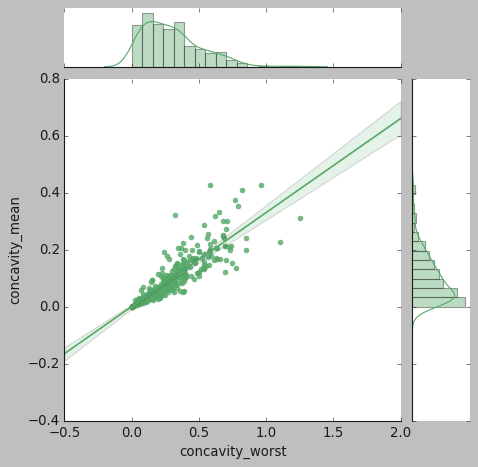

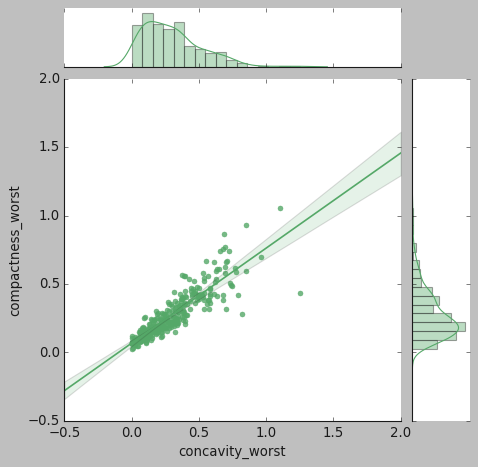

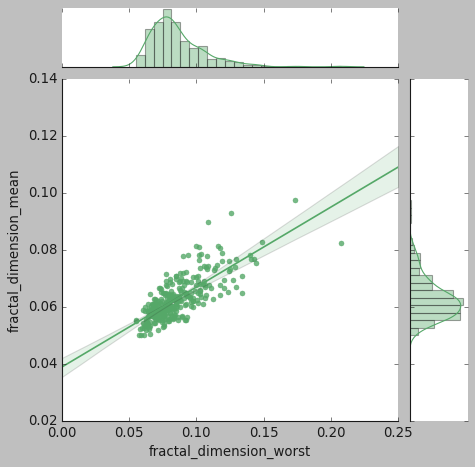

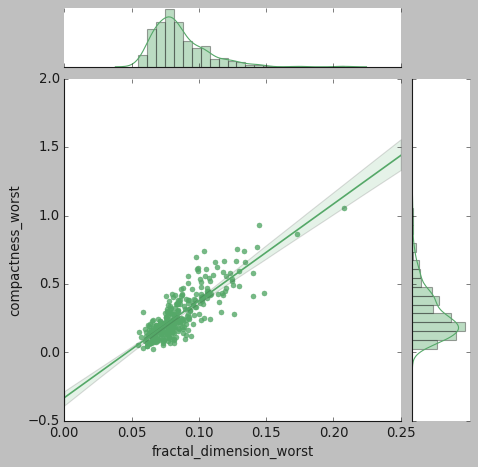

In [257]:
for i in range(0,len(corr_pairs)):
    sns.jointplot(data[corr_pairs['Col1'][i]], data[corr_pairs['Col2'][i]], kind="reg", color='g')

### <span style="font-family: Arial;font-size:1em;color:green;"> 6. Correlation HeatMap

<Figure size 800x800 with 0 Axes>

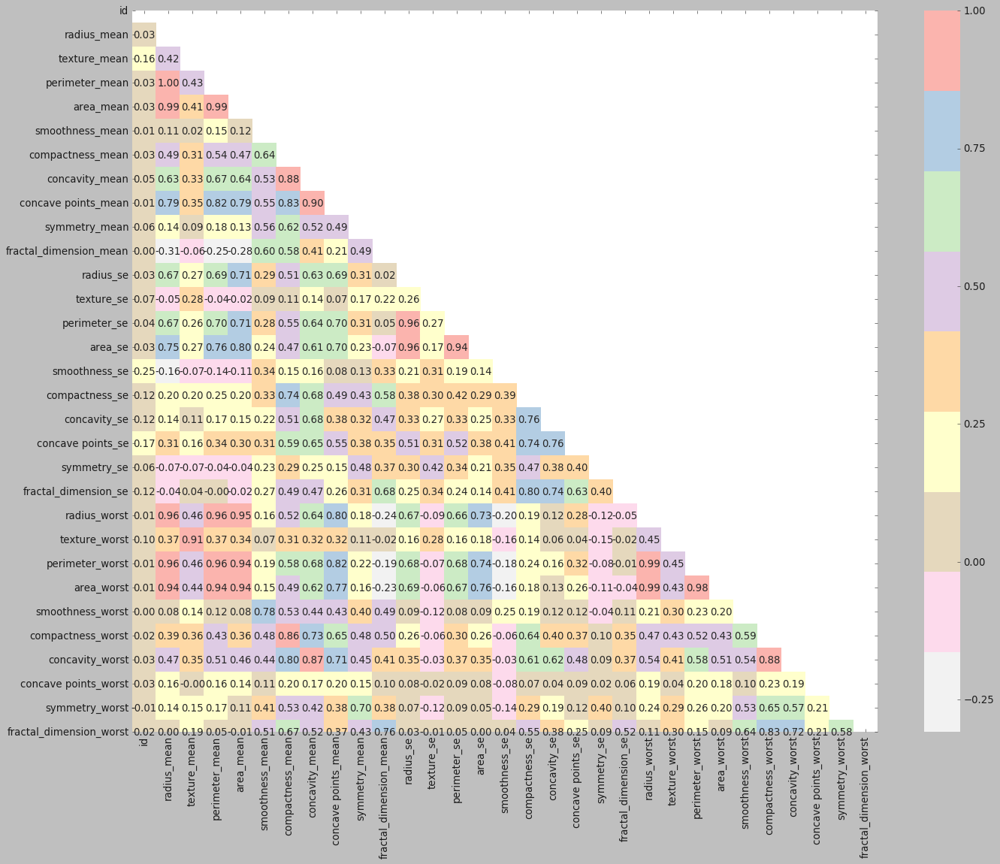

In [258]:
import pylab as pl
pl.figure(figsize = (10,10))

corr = data.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,15))
sns.heatmap(corr, mask=mask,annot=True,square=True, fmt='0.2f',cmap='Pastel1_r')

### <span style="font-family: Arial;font-size:1em;color:green;"> 7. Pair Plot Analysis

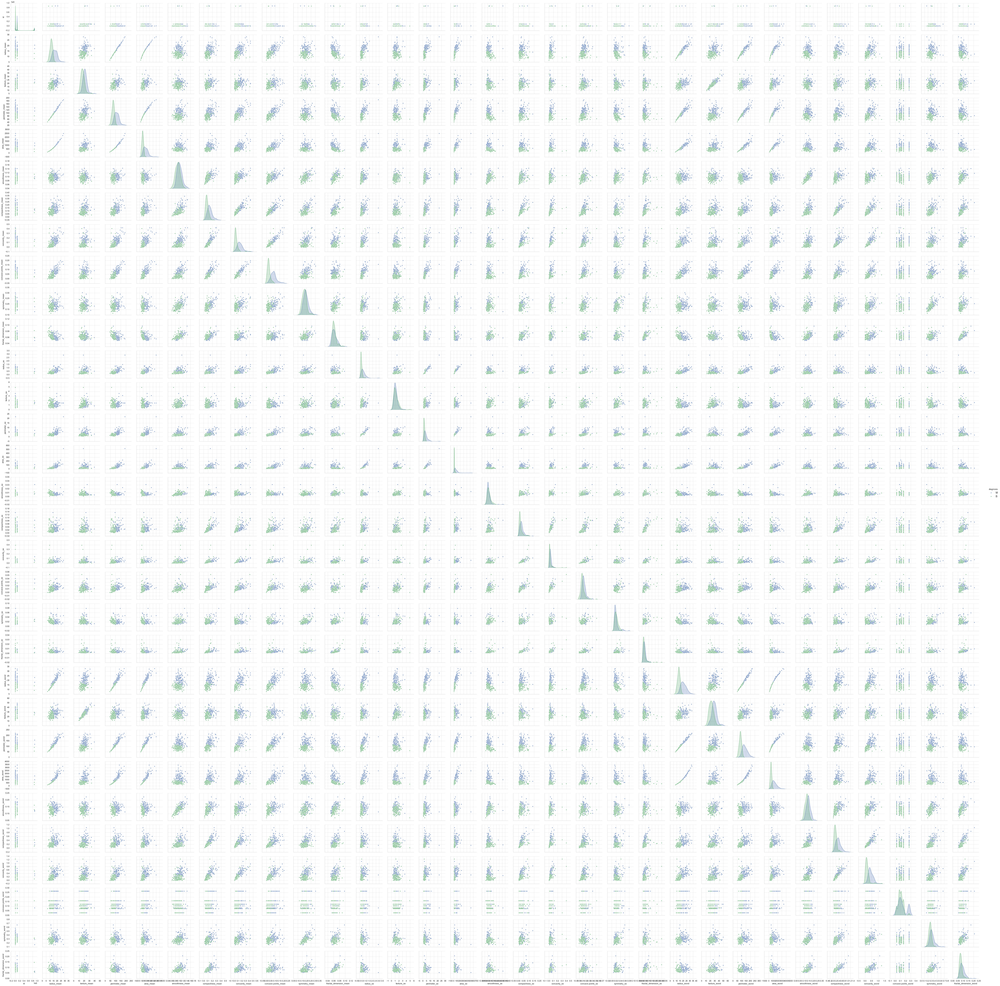

In [259]:
plt.close();
sns.set_style("whitegrid");
sns.pairplot(data=data, diag_kind = "kde", hue=Target)
plt.show()

### <span style="font-family: Arial;font-size:1em;color:green;"> 8. Plot frequency Distribution of any Numeric Attribute against the Target column:

##### <span style="font-family: Arial;font-size:1em;color:green;"> Unique Value Counts of each column: 

In [260]:
uniqueValues = data.nunique().to_frame(name='Unique')
uniqueValues.reset_index(level=None, drop=False, inplace=True)
uniqueValues.rename(columns ={'index':'Columns'},inplace=True)
DT=uniqueValues.merge(DT,on=['Columns'])
DT

,Columns,Unique,Datatypes
0,id,299,int64
1,diagnosis,2,object
2,radius_mean,265,float64
3,texture_mean,278,float64
4,perimeter_mean,282,float64
5,area_mean,287,float64
6,smoothness_mean,263,float64
7,compactness_mean,289,float64
8,concavity_mean,290,float64
9,concave points_mean,285,object


In [262]:
Group = input('Choose the main Grouping attribute other than target class: ')

Choose the main Grouping attribute other than target class: symmetry_worst


In [264]:
SubGroup = input('Choose the sub Grouping attribute (Leave blank otherwise) : ')

Choose the sub Grouping attribute (Leave blank otherwise) : concave points_worst


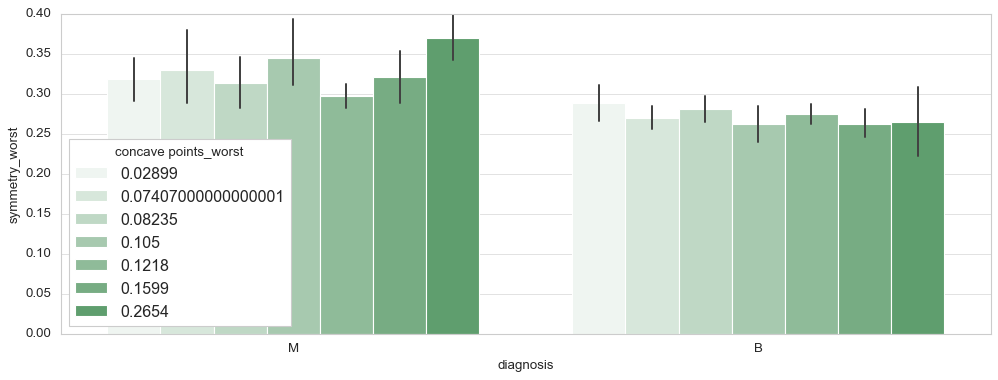

In [265]:

if SubGroup == '':
    plt.figure(figsize=(15,5))

    sns.barplot(data=data,x=Target,y=Group, color='g')
    plt.show()
else:
    plt.figure(figsize=(15,5))
    sns.barplot(data=data,x=Target,y=Group,hue=SubGroup, color='g')
    plt.show()